In [1]:
import sys
!pip install -q sktime
import sktime
import tqdm as tq
import xgboost as xgb
import matplotlib
import seaborn as sns
import sklearn as skl
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
from tqdm import tqdm
from sktime.forecasting.model_selection import temporal_train_test_split
from sktime.utils.plotting import plot_series
from xgboost import XGBRegressor

# train = pd.read_csv('/kaggle/input/818818/train_818.csv')
# valid = pd.read_csv('/kaggle/input/818818/valid_818.csv')
np.random.seed(42)

def SMAPE(true, pred):
    return np.mean((np.abs(true-pred))/(np.abs(true) + np.abs(pred))) * 200

def weighted_mse(alpha = 1):
    def weighted_mse_fixed(label, pred):
        residual = (label - pred).astype("float")
        grad = np.where(residual>0, -2*alpha*residual, -2*residual)
        hess = np.where(residual>0, 2*alpha, 2.0)
        return grad, hess
    return weighted_mse_fixed

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
def get_train2():
    info = pd.read_csv('/kaggle/input/big-one/building_info.csv').drop(['태양광용량(kW)','ESS저장용량(kWh)', 'PCS용량(kW)'], axis=1)
    info.columns = ['building', 'type', 'all_area', 'cool_area']
    types = info['type'].unique()
    value_dict = {value: index for index, value in enumerate(types)}
    info['type'] = info['type'].map(value_dict)

    info.loc[64, 'cool_area'] = 146585.0
    info.loc[65, 'cool_area'] = 83781.0
    info.loc[67, 'cool_area'] = 310488.0
    info.loc[76, 'cool_area'] = 35716.0
    info.loc[79, 'cool_area'] = 135899.6

    np.random.seed(0)

    cols = ['num_date_time', 'building', 'date_time', 'temp', 'prec','wind', 'hum', 'target']

    train = pd.read_csv('/kaggle/input/big-one/train.csv').drop(['일조(hr)', '일사(MJ/m2)'], axis=1)

    train['풍속(m/s)'] = train['풍속(m/s)'].fillna(method='ffill')
    train['습도(%)'] = train['습도(%)'].fillna(method='ffill')
    train = train.fillna(0)
    train.columns = cols
    train = train.merge(info, on='building', how='left')

    test = pd.read_csv('/kaggle/input/big-one/test.csv')
    test.columns = cols[:-1]
    test = test.merge(info, on='building', how='left')

    def add_data(df):
        for i in range(2):
            np.random.seed(i)
            num_rows = len(df)

            random_temp = df['temp'] * np.random.uniform(0.9, 1.1, num_rows)
            random_prec = df['prec'] * np.random.uniform(0.9, 1.1, num_rows)
            random_wind = df['wind'] * np.random.uniform(0.9, 1.1, num_rows)
            random_hum = df['hum'] * np.random.uniform(0.9, 1.1, num_rows)

            # 소수 첫째 자리까지 반올림
            random_temp = np.round(random_temp, 1)
            random_prec = np.round(random_prec, 1)
            random_wind = np.round(random_wind, 1)
            random_hum = np.round(random_hum, 1)

            # 새로운 데이터프레임 생성

            new_df = df.copy()
            new_df['temp'] = random_temp
            new_df['prec'] = random_prec
            new_df['wind'] = random_wind
            new_df['hum'] = random_hum

            # 기존 데이터프레임과 새로운 데이터프레임을 이어붙임
            df = pd.concat([df, new_df], ignore_index=True)
        df = df.sort_values(by=['building', 'date_time']).reset_index(drop=True)
        return df


    # 시간 관련 변수들 생성
    date = pd.to_datetime(train.date_time)
    train['hour'] = date.dt.hour
    train['dow'] = date.dt.weekday
    train['month'] = date.dt.month
    train['week'] = date.dt.isocalendar().week
    train['day'] = date.dt.day

    avg_temp = pd.pivot_table(train[train['hour']%3 == 0], values = 'temp', index = ['building', 'day'], aggfunc = np.mean).reset_index()
    avg_temp.rename(columns={'temp': 'avg_temp'}, inplace=True)
    train = pd.merge(train, avg_temp, on=['building', 'day'], how='left')

    date = pd.to_datetime(test.date_time)
    test['hour'] = date.dt.hour
    test['dow'] = date.dt.weekday
    test['month'] = date.dt.month
    test['week'] = date.dt.isocalendar().week
    test['day'] = date.dt.day

    avg_temp = pd.pivot_table(test[test['hour']%3 == 0], values = 'temp', index = ['building', 'day'], aggfunc = np.mean).reset_index()
    avg_temp.rename(columns={'temp': 'avg_temp'}, inplace=True)
    test = pd.merge(test, avg_temp, on=['building', 'day'], how='left')

    power_mean = pd.pivot_table(train, values = 'target', index = ['building', 'hour', 'dow'], aggfunc = np.mean).reset_index()
    power_mean.rename(columns={'target': 'dow_hour_mean'}, inplace=True)
    train = pd.merge(train, power_mean, on=['building', 'hour', 'dow'], how='left')
    test = pd.merge(test, power_mean, on=['building', 'hour', 'dow'], how='left')

#     power_std = pd.pivot_table(train, values = 'target', index = ['building', 'hour', 'dow'], aggfunc = np.std).reset_index()
#     power_std.rename(columns={'target': 'dow_hour_std'}, inplace=True)
#     train = pd.merge(train, power_std, on=['building', 'hour', 'dow'], how='left')
#     test = pd.merge(test, power_std, on=['building', 'hour', 'dow'], how='left')

    # type_mean = pd.pivot_table(train, values = 'target', index = ['type', 'hour', 'dow'], aggfunc = np.mean).reset_index()
    # type_mean.rename(columns={'target': 'type_hour_mean'}, inplace=True)
    # train = pd.merge(train, type_mean, on=['type', 'hour', 'dow'], how='left')
    # test = pd.merge(test, type_mean, on=['type', 'hour', 'dow'], how='left')

    # type_std = pd.pivot_table(train, values = 'target', index = ['type', 'hour', 'dow'], aggfunc = np.std).reset_index()
    # type_std.rename(columns={'target': 'type_hour_std'}, inplace=True)
    # train = pd.merge(train, type_std, on=['type', 'hour', 'dow'], how='left')
    # test = pd.merge(test, type_std, on=['type', 'hour', 'dow'], how='left')

    ### 공휴일 변수 추가
    test['date'] = pd.to_datetime(test['date_time'], format='%Y-%m-%d %H')
    train['date'] = pd.to_datetime(train['date_time'], format='%Y-%m-%d %H')

    train['holiday'] = train.apply(lambda x : 0 if x['dow'] < 5 else 1, axis = 1)
    test['holiday'] = test.apply(lambda x : 0 if x['dow'] < 5 else 1, axis = 1)

    train.loc[train['building'] == 3, 'holiday'] = 0
    train.loc[(train['building'] == 3) & (train['dow'] == 0) , 'holiday'] = 1
    train.loc[(train['building'] == 3) & (train['date_time'].str.match(r'^20220731 \d{2}$')) , 'holiday'] = 1
    train.loc[(train['building'] == 3) & (train['date_time'].str.match(r'^20220723 \d{2}$')) , 'holiday'] = 1
    train.loc[(train['building'] == 3) & (train['date_time'].str.match(r'^20220720 \d{2}$')) , 'holiday'] = 1
    test.loc[test['building'] == 3, 'holiday'] = 0
    test.loc[(test['building'] == 3) & (test['dow'] == 0) , 'holiday'] = 1

    train.loc[train['building'] == 2, 'holiday'] = 0
    train.loc[(train['building'] == 2) & (train['dow'] == 0) , 'holiday'] = 1
    train.loc[(train['building'] == 2) & (train['date_time'].str.match(r'^20220607 \d{2}$')) , 'holiday'] = 1
    train.loc[(train['building'] == 2) & (train['date_time'].str.match(r'^20220617 \d{2}$')) , 'holiday'] = 1
    test.loc[test['building'] == 2, 'holiday'] = 0
    test.loc[(test['building'] == 2) & (test['dow'] == 0) , 'holiday'] = 1

    train.loc[train['building'] == 54, 'holiday'] = 0
    train.loc[(train['building'] == 54) & (train['dow'] == 0) , 'holiday'] = 1
    train.loc[(train['building'] == 54) & (train['date_time'].str.match(r'^20220816 \d{2}$')) , 'holiday'] = 1
    train.loc[(train['building'] == 54) & (train['date_time'].str.match(r'^20220817 \d{2}$')) , 'holiday'] = 1
    test.loc[test['building'] == 54, 'holiday'] = 0
    test.loc[(test['building'] == 54) & (test['dow'] == 0) , 'holiday'] = 1

    train.loc[(train['date_time'].str.match(r'^20220601 \d{2}$')) & (train['building'] != 14) , 'holiday'] = 1
    train.loc[(train['date_time'].str.match(r'^20220606 \d{2}$')) & (train['building'] != 14), 'holiday'] = 1
    train.loc[(train['date_time'].str.match(r'^20220815 \d{2}$')) & (train['building'] != 14), 'holiday'] = 1
    train.loc[(train['building'] == 14) & (train['date_time'].str.match(r'^20220614 \d{2}$')) , 'holiday'] = 1

    def week_of_month(date):
        first_day = date.replace(day=1)
        if (date.week - first_day.week + 1) % 2 == 0:
            if date.weekday() == 6:
                return 1
        return 0

    train['week_of_month'] = train['date'].apply(week_of_month)
    test['week_of_month'] = test['date'].apply(week_of_month)

    target_buildings = [87,88,89,90,91,92]
    train.loc[(train['building'].isin(target_buildings)) , 'holiday'] = 0
    train.loc[(train['building'].isin(target_buildings)) & (train['week_of_month'] == 1), 'holiday'] = 1
    test.loc[(test['building'].isin(target_buildings)) , 'holiday'] = 0
    test.loc[(test['building'].isin(target_buildings)) & (test['week_of_month'] == 1), 'holiday'] = 1

    train.loc[train['building'] == 85, 'holiday'] = 0
    test.loc[test['building'] == 85, 'holiday'] = 0

    test['date'] = pd.to_datetime(test['date_time'], format='%Y-%m-%d %H').dt.date
    train['date'] = pd.to_datetime(train['date_time'], format='%Y-%m-%d %H').dt.date

    target_day = ['2022-06-10', '2022-08-10', '2022-07-10', '2022-07-24', '2022-06-26', '2022-07-30']
    train.loc[train['building'] == 86, 'holiday'] = 0
    test.loc[test['building'] == 86, 'holiday'] = 0
    for i in target_day:
        k = pd.to_datetime(i)
        train.loc[(train['date'] == k.date()) & (train['building'] == 86), 'holiday'] = 1
        test.loc[(test['date'] == k.date()) & (train['building'] == 86), 'holiday'] = 1

    power_holiday_mean = pd.pivot_table(train, values = 'target', index = ['building', 'hour', 'holiday'], aggfunc = np.mean).reset_index()
    power_holiday_mean.rename(columns={'target': 'holiday_mean'}, inplace=True)
    train = pd.merge(train, power_holiday_mean, on=['building', 'hour', 'holiday'], how='left')
    test = pd.merge(test, power_holiday_mean, on=['building', 'hour', 'holiday'], how='left')

    power_holiday_std = pd.pivot_table(train, values = 'target', index = ['building', 'hour', 'holiday'], aggfunc = np.std).reset_index()
    power_holiday_std.rename(columns={'target': 'holiday_std'}, inplace=True)
    train = pd.merge(train, power_holiday_std, on=['building', 'hour', 'holiday'], how='left')
    test = pd.merge(test, power_holiday_std, on=['building', 'hour', 'holiday'], how='left')

    power_hour_mean = pd.pivot_table(train, values = 'target', index = ['building', 'hour',], aggfunc = np.mean).reset_index()
    power_hour_mean.rename(columns={'target': 'hour_mean'}, inplace=True)
    train = pd.merge(train, power_hour_mean, on=['building', 'hour', ], how='left')
    test = pd.merge(test, power_hour_mean, on=['building', 'hour', ], how='left')

    power_hour_std = pd.pivot_table(train, values = 'target', index = ['building', 'hour',], aggfunc = np.std).reset_index()
    power_hour_std.rename(columns={'target': 'hour_std'}, inplace=True)
    train = pd.merge(train, power_hour_std, on=['building', 'hour', ], how='left')
    test = pd.merge(test, power_hour_std, on=['building', 'hour', ], how='left')

    # train = add_data(train)
    # valid = add_data(valid)

    ## https://dacon.io/competitions/official/235680/codeshare/2366?page=1&dtype=recent
    train['sin_time'] = np.sin(2*np.pi*train.hour/24)
    train['cos_time'] = np.cos(2*np.pi*train.hour/24)
    test['sin_time'] = np.sin(2*np.pi*test.hour/24)
    test['cos_time'] = np.cos(2*np.pi*test.hour/24)

    train['THI'] = 9/5*train['temp'] - 0.55*(1-train['hum']/100)*(9/5*train['hum']-26)+32
    #train['THI']=pd.cut(train.THI, bins=[-100, 68, 75, 80, 200], labels=['0', '1', '2', '3'])
    test['THI'] = 9/5*test['temp'] - 0.55*(1-test['hum']/100)*(9/5*test['hum']-26)+32
    #test['THI']=pd.cut(test.THI, bins=[-100, 68, 75, 80, 200], labels=['0', '1', '2', '3'])

    train['WC']=13.12+0.6215*train['temp']-13.947*train['wind']**0.16+0.486*train['temp']*train['wind']**0.16
    #train['WC']=pd.cut(train.WC, bins=[-100, 21, 25, 28, 31, 100], labels=[0,1,2,3,4])
    test['WC']=13.12+0.6215*test['temp']-13.947*test['wind']**0.16+0.486*test['temp']*test['wind']**0.16
    #test['WC']=pd.cut(test.WC, bins=[-100, 21, 25, 28, 31, 100], labels=[0,1,2,3,4])

    def CDH(xs):
        ys = []
        for i in range(len(xs)):
            if i < 11:
                ys.append(np.sum(xs[:(i+1)]-26))
            else:
                ys.append(np.sum(xs[(i-11):(i+1)]-26))
        return np.array(ys)

    cdhs = np.array([])
    for num in range(1,101):
        temp = train[train['building'] == num]
        cdh = CDH(temp['temp'].values)
        cdhs = np.concatenate([cdhs, cdh])
    train['CDH'] = cdhs

    cdhs = np.array([])
    for num in range(1,101):
        temp = test[test['building'] == num]
        cdh = CDH(temp['temp'].values)
        cdhs = np.concatenate([cdhs, cdh])
    test['CDH'] = cdhs

#     train['THI'] = train['THI'].astype('int')
#     train['WC'] = train['WC'].astype('int')
#     test['THI'] = test['THI'].astype('int')
#     test['WC'] = test['WC'].astype('int')
    train['week'] = train['week'].astype(np.int32)
    test['week'] = test['week'].astype(np.int32)

    def new_type(i):
        if i in [1,2,3,8,9,11,12,13,14,15]: return 0
        elif i in [17,18,19,20,21,22,23]: return 1
        elif i in [24,25,26,27,28,29,30,31]: return 2
        elif i in [32,33,34,35,36]: return 3
        elif i in [37,38,39,40,41,42,43,44]: return 4
        elif i in [45,46,47,48,49,50,51,52]: return 5
        elif i in [55,56,57,58]: return 6
        elif i in [53,54,59,60]: return 7
        elif i in [61,62,63,64,65,66,67,68]: return 8
        elif i in [69,70,71,72,73,74,75,76]: return 9
        elif i in [77,78,79,80,81,82,83,84]: return 10
        elif i in [87,88,89,90,91,92]: return 11
        elif i in [93,95,97,98,99,100]: return 12
        else: return 13

    train['new_type'] = train['building'].apply(new_type)
    test['new_type'] = test['building'].apply(new_type)

    # 37 : 620 711 88 617
    # 38 : 613 725 81
    # 39 : 718 88
    # 40 : 718 620 617 88
    # 41 : 627 725 88
    # 42 : 613 822 711
    
    target_buildings = [37,38,39,40,41,42]
    train.loc[(train['building'].isin(target_buildings)) , 'holiday'] = 0
    test.loc[(test['building'].isin(target_buildings)) , 'holiday'] = 0
    train.loc[(train['building'] == 37) & (train['date'].isin([pd.to_datetime(i).date() for i in ['2022-06-20', '2022-07-11', '2022-08-08', '2022-06-17']])), 'holiday'] = 1
    train.loc[(train['building'] == 38) & (train['date'].isin([pd.to_datetime(i).date() for i in ['2022-06-13', '2022-07-25', '2022-08-01']])), 'holiday'] = 1
    train.loc[(train['building'] == 39) & (train['date'].isin([pd.to_datetime(i).date() for i in ['2022-07-18', '2022-08-08']])), 'holiday'] = 1
    train.loc[(train['building'] == 40) & (train['date'].isin([pd.to_datetime(i).date() for i in ['2022-06-20', '2022-07-18', '2022-06-17', '2022-08-08']])), 'holiday'] = 1
    train.loc[(train['building'] == 41) & (train['date'].isin([pd.to_datetime(i).date() for i in ['2022-06-27', '2022-07-25', '2022-08-08']])), 'holiday'] = 1
    train.loc[(train['building'] == 42) & (train['date'].isin([pd.to_datetime(i).date() for i in ['2022-06-13', '2022-07-11', '2022-08-22']])), 'holiday'] = 1
            
            
    train.drop(['hour', 'week_of_month', 'avg_temp', 'new_type', 'prec', 'day',  ], axis = 1, inplace = True)
    test.drop(['hour', 'week_of_month', 'avg_temp', 'new_type', 'prec', 'day',  ], axis = 1, inplace = True)
# type day
    print('done')
    return train, test
train, test = get_train2()

done


In [9]:
import optuna
import optuna.logging
from tqdm import tqdm

optuna.logging.set_verbosity(optuna.logging.WARNING)
train['date'] = pd.to_datetime(train['date'])
train['building'] = train['building'].astype('category')
train['new_type'] = train['new_type'].astype('category')

x_train = train[train['date'] < '2022-08-18'].drop(['num_date_time', 'date_time', 'target', 'date'], axis=1)
x_valid = train[train['date'] >= '2022-08-18'].drop(['num_date_time', 'date_time', 'target', 'date'], axis=1)
y_train = train[train['date'] < '2022-08-18']['target']
y_valid = train[train['date'] >= '2022-08-18']['target']

dtrain = xgb.DMatrix(data=x_train, label=y_train, enable_categorical=True)
dvalid = xgb.DMatrix(data=x_valid, label=y_valid, enable_categorical=True)

def objective(trial):
    param = {
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-3, 10.0),
        'gamma': trial.suggest_float('gamma', 1e-3, 10),
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-3, 10.0),
        'colsample_bytree': trial.suggest_categorical('colsample_bytree', [0.5, 0.6, 0.7, 0.8, 0.9, 1.0]),
        'subsample': trial.suggest_categorical('subsample', [0.6, 0.7, 0.8, 1.0]),
        'max_depth': trial.suggest_categorical('max_depth', [3, 4, 5, 6]),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 300),
    }

    model = xgb.train(params=param, dtrain=dtrain, num_boost_round=1000,
                      evals=[(dvalid, 'valid')], early_stopping_rounds=100, verbose_eval=False)

    preds = model.predict(dvalid)
    smape = SMAPE(y_valid, preds)

    return smape

study = optuna.create_study(direction='minimize', study_name=None)
with tqdm(total=500) as pbar:  
    def callback(study, trial):
        pbar.update(1)  

    study.optimize(objective, n_trials=500, callbacks=[callback])
    
df = study.trials_dataframe().sort_values(by=['value'], ascending=[True])
df.to_csv('parameters.csv', index=False)
df.head(5)
# params_colsample_bytree 0.9 params_gamma 8.161415 params_max_depth 6 params_min_child_weight 47 
# params_reg_alpha 6.721675 params_reg_lambda 6.064121 params_subsample 1

100%|██████████| 500/500 [4:02:57<00:00, 29.16s/it]  


,number,value,datetime_start,datetime_complete,duration,params_colsample_bytree,params_gamma,params_max_depth,params_min_child_weight,params_reg_alpha,params_reg_lambda,params_subsample,state
441,441,5.006260,2023-08-03 08:22:21.020325,2023-08-03 08:22:49.545102,0 days 00:00:28.524777,0.6,4.421136,6,146,3.394038,3.405631,1.0,COMPLETE
160,160,5.020759,2023-08-03 06:05:01.250381,2023-08-03 06:05:29.692519,0 days 00:00:28.442138,0.8,4.030400,6,161,5.638944,1.962060,1.0,COMPLETE
406,406,5.022939,2023-08-03 08:05:24.178456,2023-08-03 08:05:45.780833,0 days 00:00:21.602377,0.7,3.887628,6,126,2.942820,3.039322,1.0,COMPLETE
127,127,5.030703,2023-08-03 05:49:24.897417,2023-08-03 05:49:46.648932,0 days 00:00:21.751515,0.6,3.757635,6,160,6.882516,2.330117,1.0,COMPLETE
422,422,5.032453,2023-08-03 08:13:15.956257,2023-08-03 08:13:45.594478,0 days 00:00:29.638221,0.7,3.933390,6,149,1.479623,0.456302,1.0,COMPLETE


In [3]:
colsample_bytree = [0.9,0.9,0.8,0.9,0.9]
gamma = [8.161415, 8.915918, 8.249356, 6.575258, 8.487247]
max_depth = [6,5,6,6,6]
min_child_weight = [47,8,30,54,77]
reg_alpha = [6.721675, 6.736361, 7.109872, 7.016596, 6.186162]
reg_lambda = [6.064121, 5.957454, 5.927528, 5.413840, 4.798086]
subsample = [1.0,1.0,1.0,1.0,1.0]
value = [5.010795, 5.016419, 5.017388, 5.023210, 5.028135]

df = pd.DataFrame({'params_colsample_bytree':colsample_bytree, 'params_gamma':gamma, 'params_max_depth':max_depth, 'params_min_child_weight':min_child_weight,
             'params_reg_alpha':reg_alpha, 'params_reg_lambda':reg_lambda, 'params_subsample':subsample, 'value':value})

In [6]:
# params_colsample_bytree 0.9 params_gamma 8.161415 params_max_depth 6 params_min_child_weight 47 
# params_reg_alpha 6.721675 params_reg_lambda 6.064121 params_subsample 1
for n in range(18, 24):
    score, best_it = [], []

    train['date'] = pd.to_datetime(train['date'])
    train['building'] = train['building'].astype('category')
    train['type'] = train['type'].astype('category')
   # n = 18
    x_train = train[train['date'] < f'2022-08-{n}'].drop(['num_date_time', 'date_time', 'target', 'date'], axis=1)
    x_valid = train[train['date'] >= f'2022-08-{n}'].drop(['num_date_time', 'date_time', 'target', 'date'], axis=1)
    y_train = train[train['date'] < f'2022-08-{n}']['target']
    y_valid = train[train['date'] >= f'2022-08-{n}']['target']

    dtrain = xgb.DMatrix(data=x_train, label=y_train, enable_categorical=True)
    dvalid = xgb.DMatrix(data=x_valid, label=y_valid, enable_categorical=True)
    i=0
    for seed in tqdm(range(5)):
        param = {
            'reg_lambda': df['params_reg_lambda'][i] ,
            'gamma': df['params_gamma'][i],
            'reg_alpha': df['params_reg_alpha'][i] ,
            'colsample_bytree': df['params_colsample_bytree'][i] ,
            'subsample': df['params_subsample'][i] ,
            'max_depth': df['params_max_depth'][i],
            'min_child_weight': df['params_min_child_weight'][i],
            'seed':seed,
        }

        model = xgb.train(params=param, dtrain=dtrain, num_boost_round=1000,
                          evals=[(dvalid, 'valid')], early_stopping_rounds=100, verbose_eval=False)

        preds = model.predict(dvalid)

        # Calculate SMAPE
        smape = SMAPE(y_valid, preds)

        score.append(smape)
        best_it.append(model.best_iteration+1)

    print(sum(score)/len(score), best_it)
    
# 18 5.076640192956188 
# 19 5.202971543976758 
# 20 5.392535840058136 
# 21 5.350072788074576 
# 22 5.225030430092201 
# 23 4.778452769363578 

100%|██████████| 5/5 [03:03<00:00, 36.61s/it]


5.076640192956188 [251, 292, 189, 135, 79]


100%|██████████| 5/5 [03:24<00:00, 40.99s/it]


5.202971543976758 [182, 147, 290, 249, 262]


100%|██████████| 5/5 [02:59<00:00, 35.86s/it]


5.392535840058136 [144, 237, 93, 208, 202]


100%|██████████| 5/5 [03:34<00:00, 43.00s/it]


5.350072788074576 [240, 119, 214, 301, 302]


100%|██████████| 5/5 [04:07<00:00, 49.52s/it]


5.225030430092201 [292, 291, 196, 331, 268]


100%|██████████| 5/5 [03:38<00:00, 43.75s/it]

4.778452769363578 [167, 403, 132, 229, 212]


In [5]:
score, best_it = [], []

train['date'] = pd.to_datetime(train['date'])
train['building'] = train['building'].astype('category')
train['type'] = train['type'].astype('category')
n = 18
x_train = train[train['date'] < f'2022-08-{n}'].drop(['num_date_time', 'date_time', 'target', 'date'], axis=1).reset_index(drop=True)
x_valid = train[train['date'] >= f'2022-08-{n}'].drop(['num_date_time', 'date_time', 'target', 'date'], axis=1).reset_index(drop=True)
y_train = train[train['date'] < f'2022-08-{n}']['target'].reset_index(drop=True)
y_valid = train[train['date'] >= f'2022-08-{n}']['target'].reset_index(drop=True)

dtrain = xgb.DMatrix(data=x_train, label=y_train, enable_categorical=True)
dvalid = xgb.DMatrix(data=x_valid, label=y_valid, enable_categorical=True)

# preds = np.array([])
# pred_df = pd.DataFrame()
for i in tqdm(range(5)):
    i = 0
    param = {
        'reg_lambda': df['params_reg_lambda'][i] ,
        'gamma': df['params_gamma'][i],
        'reg_alpha': df['params_reg_alpha'][i] ,
        'colsample_bytree': df['params_colsample_bytree'][i] ,
        'subsample': df['params_subsample'][i] ,
        'max_depth': df['params_max_depth'][i],
        'min_child_weight': df['params_min_child_weight'][i],
  #      'seed':0,
    }

    model = xgb.train(params=param, dtrain=dtrain, num_boost_round=1000,
                      evals=[(dvalid, 'valid')], early_stopping_rounds=100, verbose_eval=False)

    preds = model.predict(dvalid)
 #   pred_df.loc[:,seed] = preds 

    # Calculate SMAPE
    smape = SMAPE(y_valid, preds)

    score.append(smape)
    best_it.append(model.best_iteration+1)

# preds = np.array([])
# pred = pred_df.mean(axis=1)       
# preds = np.append(preds, pred) 
print(sum(score)/len(score), best_it)

100%|██████████| 5/5 [03:31<00:00, 42.33s/it]

5.010795060857856 [251, 251, 251, 251, 251]


In [22]:
preds = np.array([])
preds = np.append(preds, pred) 
x_valid = train[train['date'] >= f'2022-08-{n}']
x_valid['all'] = preds

x_valid.to_csv('check.csv',index=False)

/tmp/ipykernel_32/1332014472.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_valid['all'] = preds


In [9]:
k = pd.read_csv('/kaggle/input/gergegew/score.csv')
s = []
for i in range(100):
    s.append(SMAPE(y_valid[i*168:(i+1)*168], preds[i*168:(i+1)*168]))
k['score_all'] = s
k.to_csv('score.csv',index=False)

In [7]:
preds = np.array([])

train['date'] = pd.to_datetime(train['date'])
train['building'] = train['building'].astype('category')
train['type'] = train['type'].astype('category')

test['date'] = pd.to_datetime(test['date'])
test['building'] = test['building'].astype('category')
test['type'] = test['type'].astype('category')

x_train = train.drop(['num_date_time', 'date_time', 'target', 'date'], axis=1)
x_test = test.drop(['num_date_time', 'date_time', 'date'], axis=1)
y_train = train['target']

dtrain = xgb.DMatrix(data=x_train, label=y_train, enable_categorical=True)
dtest = xgb.DMatrix(data=x_test, enable_categorical=True)

pred_df = pd.DataFrame()   # 시드별 예측값을 담을 data frame

i = 0
for seed in tqdm(range(5)):
    param = {
        'reg_lambda': df['params_reg_lambda'][i] ,
        'gamma': df['params_gamma'][i],
        'reg_alpha': df['params_reg_alpha'][i] ,
        'colsample_bytree': df['params_colsample_bytree'][i] ,
        'subsample': df['params_subsample'][i] ,
        'max_depth': df['params_max_depth'][i],
        'min_child_weight': df['params_min_child_weight'][i],
        'seed':seed,
    }

    model = xgb.train(params=param, dtrain=dtrain, num_boost_round=best_it[seed])

    y_pred = model.predict(dtest)
    pred_df.loc[:,seed] = y_pred   # 각 시드별 예측 담기

pred = pred_df.mean(axis=1)        # (i+1)번째 건물의 예측 =  (i+1)번째 건물의 각 시드별 예측 평균값
preds = np.append(preds, pred)   
    
submission = pd.read_csv('/kaggle/input/818818/sample_submission.csv')
submission['answer'] = preds
submission.to_csv('./all_xgb.csv', index = False)
submission

100%|██████████| 5/5 [02:40<00:00, 32.13s/it]


,num_date_time,answer
0,1_20220825 00,1872.716064
1,1_20220825 01,1808.524780
2,1_20220825 02,1699.023804
3,1_20220825 03,1632.295166
4,1_20220825 04,1691.882446
...,...,...
16795,100_20220831 19,910.326477
16796,100_20220831 20,849.877747
16797,100_20220831 21,749.381836
16798,100_20220831 22,653.943176


In [15]:
preds = np.array([])

train['date'] = pd.to_datetime(train['date'])
train['building'] = train['building'].astype('category')
train['new_type'] = train['new_type'].astype('category')

test['date'] = pd.to_datetime(test['date'])
test['building'] = test['building'].astype('category')
test['type'] = test['type'].astype('category')

x_train = train.drop(['num_date_time', 'date_time', 'target', 'date'], axis=1)
x_test = test.drop(['num_date_time', 'date_time', 'date'], axis=1)
y_train = train['target']

dtrain = xgb.DMatrix(data=x_train, label=y_train, enable_categorical=True)
dtest = xgb.DMatrix(data=x_test, enable_categorical=True)

pred_df = pd.DataFrame()   # 시드별 예측값을 담을 data frame
i = 0
for index, seed in tqdm(enumerate([0,1,2,3,4])):
    param = {
        'reg_lambda': df['params_reg_lambda'][i] ,
        'gamma': df['params_gamma'][i],
        'reg_alpha': df['params_reg_alpha'][i] ,
        'colsample_bytree': df['params_colsample_bytree'][i] ,
        'subsample': df['params_subsample'][i] ,
        'max_depth': df['params_max_depth'][i],
        'min_child_weight': df['params_min_child_weight'][i],
        'seed':0,
    }
    
    model = xgb.train(params=param, dtrain=dtrain, num_boost_round=best_it[index])
    
    y_pred = model.predict(dtest)
    pred_df.loc[:,seed] = y_pred   # 각 시드별 예측 담기

pred = pred_df.mean(axis=1)        # (i+1)번째 건물의 예측 =  (i+1)번째 건물의 각 시드별 예측 평균값
preds = np.append(preds, pred)   
    
submission = pd.read_csv('/kaggle/input/818818/sample_submission.csv')
submission['answer'] = preds
submission.to_csv('./all_xgb.csv', index = False)
submission

5it [02:08, 25.77s/it]


,num_date_time,answer
0,1_20220825 00,1849.058594
1,1_20220825 01,1794.220093
2,1_20220825 02,1708.843384
3,1_20220825 03,1661.757812
4,1_20220825 04,1699.035767
...,...,...
16795,100_20220831 19,898.327759
16796,100_20220831 20,841.648254
16797,100_20220831 21,737.509277
16798,100_20220831 22,650.917603


/opt/conda/lib/python3.10/site-packages/sktime/utils/plotting.py:112: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, figsize=plt.figaspect(0.25))


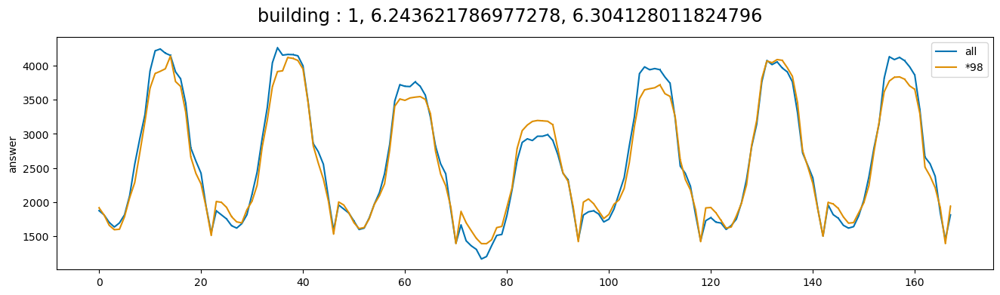

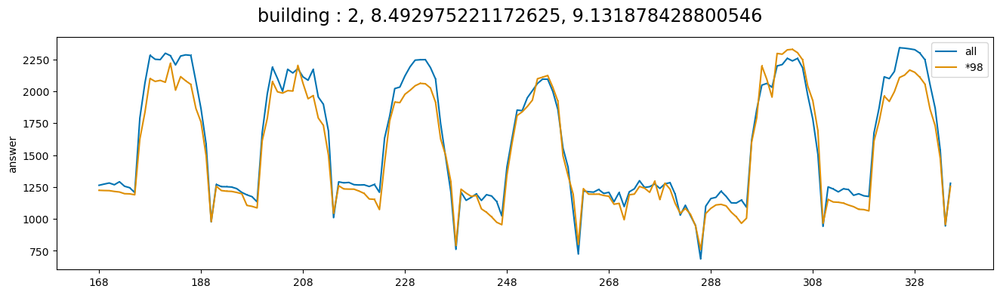

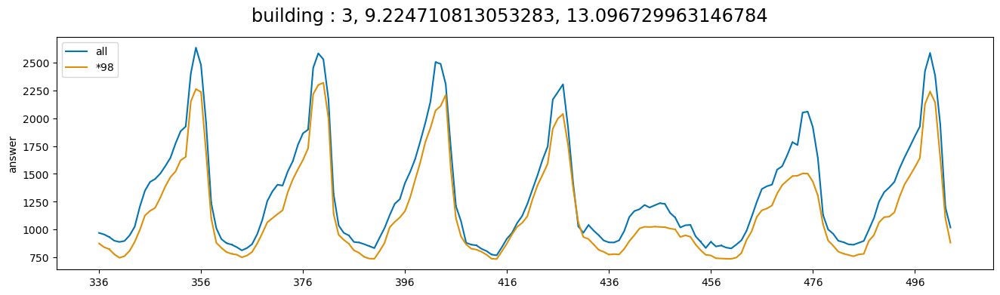

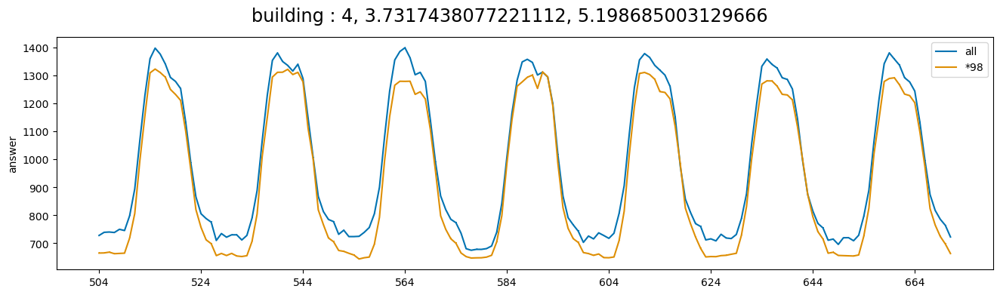

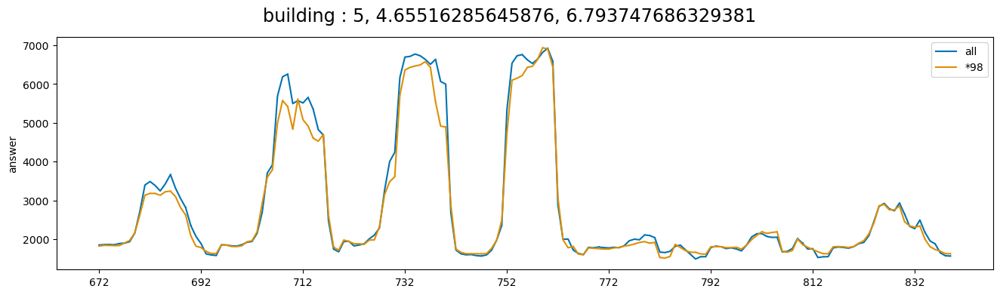

...

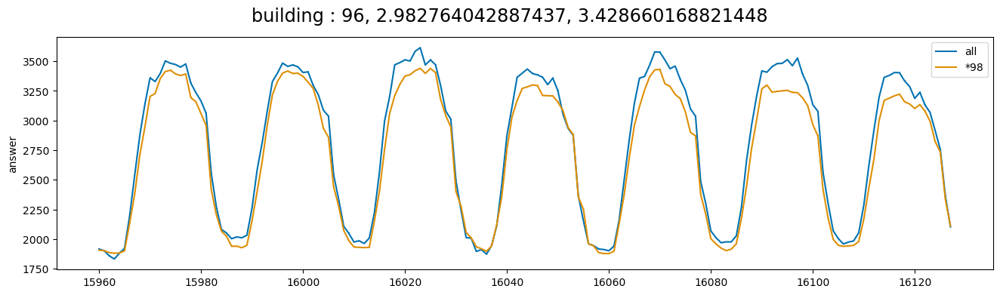

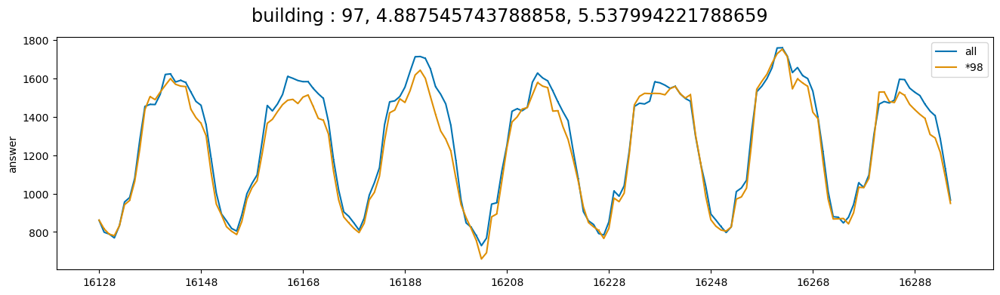

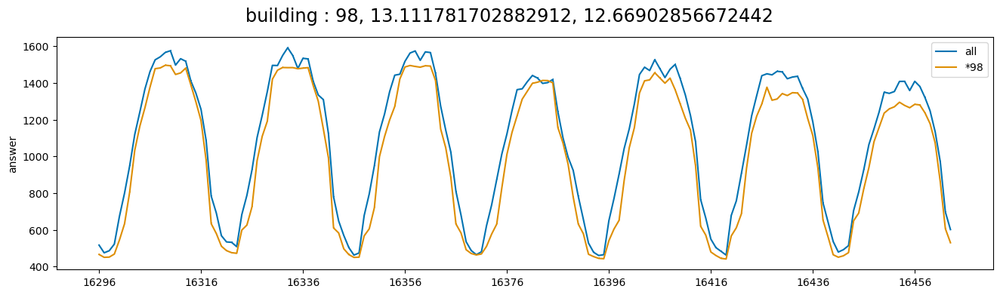

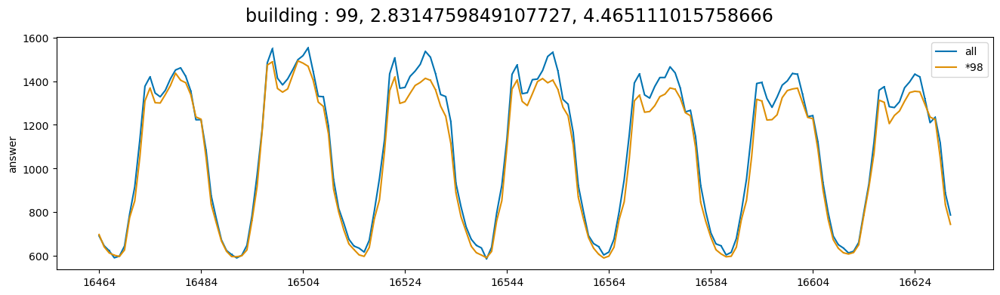

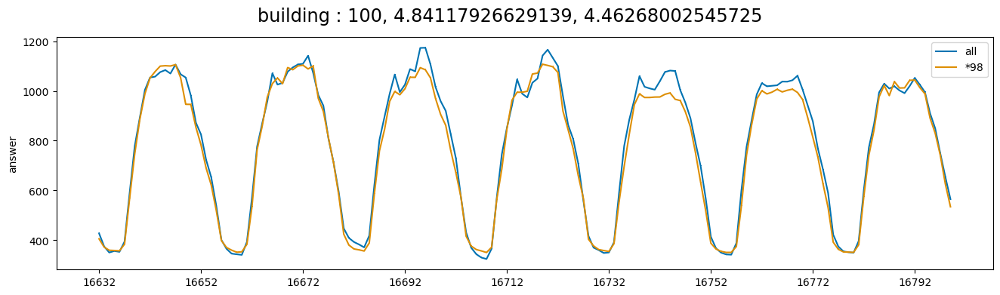

In [4]:
a = pd.read_csv('/kaggle/input/gergegew/all_xgb.csv')
c = pd.read_csv('/kaggle/input/gergegew/5.67_0.98.csv')
k = pd.read_csv('/kaggle/input/gergegew/score.csv')
for i in range(100):
    plot_series(a.answer[168*i:168*(i+1)], c.answer[168*i:168*(i+1)],  markers=[',', ',' ], labels=[ 'all', '*98'], title=f'building : {i+1}, {k.score[i]}, {k.score_all[i]}')